<h1>目录<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#功能测试" data-toc-modified-id="功能测试-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>功能测试</a></span></li><li><span><a href="#批处理" data-toc-modified-id="批处理-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>批处理</a></span></li><li><span><a href="#检验批处理结果" data-toc-modified-id="检验批处理结果-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>检验批处理结果</a></span></li></ul></div>

In [1]:
svg_path = r'/home/liucc/Workspace/Ellipse/03_results/01_industry/03_ellipse_svg/'
ell_path = r'/home/liucc/Workspace/Ellipse/03_results/01_industry/04_ellipse_label/'
raw_path = r'/home/liucc/Workspace/Ellipse/03_results/01_industry/01_raw/'


# 功能测试

In [2]:
from xml.dom import minidom
import numpy as np

def parse_ellipse(ellipse,dx,dy,ew,eh,stype):
    
    if stype=='ellipse':
        x = float(ellipse.getAttribute("cx"))
        y = float(ellipse.getAttribute("cy"))
        a = float(ellipse.getAttribute("rx"))
        b = float(ellipse.getAttribute("ry"))
    elif stype=='circle':
        x = float(ellipse.getAttribute("cx"))
        y = float(ellipse.getAttribute("cy"))
        a = float(ellipse.getAttribute("r"))
        b = float(ellipse.getAttribute("r"))

    theta = 0.0

    if ellipse.hasAttribute("transform"):
        trans = ellipse.getAttribute("transform")
        va,vb,vc,vd,ve,vf = [float(v) for v in trans[7:-1].split(' ')]

        rot_m = np.array([[va,vc],[vb,vd]])

        nxy = np.matmul(rot_m,np.array([[x],[y]]))+np.array([[ve],[vf]])

        theta = np.arctan2(vb,va)*180/np.pi

        x = nxy[0,0]
        y = nxy[1,0]

    x += dx
    y += dy

    x*=ew
    y*=eh
    a*=ew
    b*=eh

    return [x,y,a,b,theta]

def read_ellipse_svg(fpath):
    
    params = []
    
    doc = minidom.parse(fpath)  # parseString also exists
   
    img = doc.getElementsByTagName('image')[0]
    dx = 0
    dy = 0
    ew = 1
    eh = 1
    if img.hasAttribute("transform"):
        trans = img.getAttribute("transform")
        va,vb,vc,vd,ve,vf = [float(v) for v in trans[7:-1].split(' ')]
        
        dx = -ve
        dy = -vf
        
        ew = 1/va if va>0 else 1
        eh = 1/vd if vd>0 else 1
    
    
    for ellipse in doc.getElementsByTagName('ellipse'):
        params.append(parse_ellipse(ellipse,dx,dy,ew,eh,'ellipse'))
        
    for ellipse in doc.getElementsByTagName('circle'):
        params.append(parse_ellipse(ellipse,dx,dy,ew,eh,'circle'))
            
    
    doc.unlink()
    
    return params

        


In [3]:
def draw_ellipse(x,y,a,b,o):
    o = o*np.pi/180

    t = np.linspace(0, 2*np.pi, 100)
    Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
         
    R_rot = np.array([[np.cos(o) , -np.sin(o)],[np.sin(o) , np.cos(o)]])  
    
    Ell = np.dot(R_rot,Ell)
    
    Ell = Ell + np.array([[x],[y]])
        
    return Ell

In [4]:
import os 
fnames = os.listdir(svg_path)
fnames = [n[:-4] for n in fnames if n[-3:]=='svg']
fnames.sort()
print(fnames[:10])

['001', '002', '003', '004', '005', '006', '007', '008', '009', '010']


In [5]:
for fname in fnames:
    doc = minidom.parse(f'{svg_path}{fname}.svg')  # parseString also exists
    
    num = len(doc.getElementsByTagName('path'))
    
    if num>0:
        print(f'{fname}: {num}')

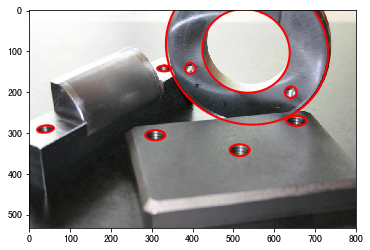

In [7]:
import imageio
import matplotlib.pyplot as plt

_id = 66
fname = fnames[_id-1]

doc = minidom.parse(f'{svg_path}{fname}.svg')  # parseString also exists
    
num = len(doc.getElementsByTagName('path'))

if num>0:
    print(f'{fname}: {num}')

params = read_ellipse_svg(f'{svg_path}{fname}.svg')

img = imageio.imread(f'{raw_path}{fname}.jpg')

for param in params:
    ell = draw_ellipse(*param)

    plt.plot(ell[0,:],ell[1,:],color='red',linewidth='2')

plt.imshow(img)
    
    
plt.show()


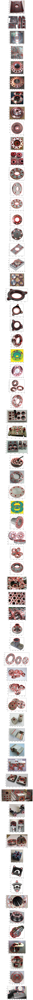

In [9]:
import imageio
import matplotlib.pyplot as plt

_,axes = plt.subplots(nrows=len(fnames),figsize=(10,5*len(fnames)))

for fname,ax in zip(fnames,axes):
    params = read_ellipse_svg(f'{svg_path}{fname}.svg')

    img = imageio.imread(f'{raw_path}{fname}.jpg')

    for param in params:
        ell = draw_ellipse(*param)

        ax.plot(ell[0,:],ell[1,:],color='red',linewidth='2')

    ax.imshow(img)
    
    
plt.show()


# 批处理

In [10]:
for fname in fnames:
    
    print(fname)
    
    params = read_ellipse_svg(f'{svg_path}{fname}.svg')
    
    with open(f'{ell_path}{fname}.txt','w') as f:
        
        lines = [' '.join([str(v) for v in param]) for param in params]
        content = '\n'.join(lines)
        
        f.write(content)
            

001
002
003
004
005
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
026
027
028
029
030
031
032
033
034
035
036
037
038
039
040
041
042
043
044
045
046
047
048
049
050
051
052
053
054
055
056
057
058
059
060
061
062
063
064
065
066


# 检验批处理结果

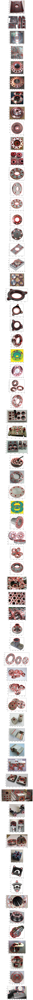

In [11]:
import imageio
import matplotlib.pyplot as plt

_,axes = plt.subplots(nrows=len(fnames),figsize=(10,5*len(fnames)))

for fname,ax in zip(fnames,axes):
    
    txt = ""
    with open(f'{ell_path}{fname}.txt','r') as f:
        txt = f.read()
        
        
    if txt=="":
        print(f'Error:{fname}')
        continue
        
    params = [[float(v) for v in l.split(' ')] for l in txt.split('\n')]
    

    img = imageio.imread(f'{raw_path}{fname}.jpg')

    for param in params:
        ell = draw_ellipse(*param)

        ax.plot(ell[0,:],ell[1,:],color='red',linewidth='2')

    ax.imshow(img)
    
    
plt.show()